In [12]:
import os
import cv2
import numpy as np
from glob import glob
import tensorflow as tf
from model import build_unet
import matplotlib.pyplot as plt
from tensorflow.keras import backend as K
from tensorflow.keras.utils import to_categorical
from sklearn.utils import compute_sample_weight, class_weight
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, CSVLogger, EarlyStopping
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate, Input

In [2]:
X_SIZE, Y_SIZE = (256, 256)
num_classes = 3

### Helper Functions

In [3]:
def load_data(path):
    img_paths = sorted(glob(os.path.join(path, "img", "*.png")))
    print(len(img_paths))
    images = np.zeros([len(img_paths), X_SIZE, Y_SIZE, 3], dtype=np.float32)

    mask_paths = sorted(glob(os.path.join(path, "annotations", "*.png")))
    masks = np.zeros([len(mask_paths), X_SIZE, Y_SIZE, num_classes], dtype=np.float32)
    
    for i, (img_path, mask_path) in enumerate(zip(img_paths, mask_paths)):
        img = cv2.imread(img_path)
        img = cv2.resize(img, (X_SIZE, Y_SIZE), interpolation=cv2.INTER_NEAREST)
        img = img / 255.0
        images[i] = img

        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        mask = cv2.resize(mask, (X_SIZE, Y_SIZE), interpolation=cv2.INTER_NEAREST)
        mask = to_categorical(mask, num_classes=num_classes)
        masks[i] = mask

    return (images, masks)

In [4]:
def apply_color(mask):
    colorized = np.zeros((mask.shape[0], mask.shape[1], 3))

    colorized[mask[:,:,1] == 1] = (255, 0, 0)
    colorized[mask[:,:,2] == 1] = (0, 255, 0)

    return (colorized).astype(np.uint8)

In [5]:
def weighted_categorical_crossentropy(weights):
    weights = tf.constant(weights, dtype=tf.float32)
    
    def loss(y_true, y_pred):
        y_true = tf.cast(y_true, tf.float32)
        y_pred = tf.cast(y_pred, tf.float32)
        
        # Compute the unweighted loss
        unweighted_loss = tf.keras.losses.categorical_crossentropy(y_true, y_pred) 
        
        # Apply the weights to each class
        weight_mask = tf.reduce_sum(weights * y_true, axis=-1)
        
        # Compute the weighted loss
        weighted_loss = unweighted_loss * weight_mask
        
        return tf.reduce_mean(weighted_loss)
    
    return loss

In [6]:
def f1_score(y_true, y_pred):
    # Convert predictions to one-hot encoding
    y_pred = tf.argmax(y_pred, axis=-1)
    y_pred = tf.one_hot(y_pred, depth=y_true.shape[-1])
    
    # Cast to float32 for calculations
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    
    # Calculate true positives, false positives, and false negatives
    tp = K.sum(y_true * y_pred, axis=[0, 1, 2])
    fp = K.sum(y_pred, axis=[0, 1, 2]) - tp
    fn = K.sum(y_true, axis=[0, 1, 2]) - tp
    
    # Calculate precision and recall
    precision = tp / (tp + fp + K.epsilon())
    recall = tp / (tp + fn + K.epsilon())
    
    # Calculate F1 score
    f1 = 2 * (precision * recall) / (precision + recall + K.epsilon())
    f1 = tf.reduce_mean(f1)  # Average F1 score across classes
    return f1

## Loading Data

### Convert Images to Numpy Array and Save

In [7]:
# dir1 = "./augmented_data/aug/"
# dir2 = "./students_data/cleaned_data/"
# numpy_array_path = "img_numpy_aug"

# train_x, train_y = load_data(os.path.join(dir1))
# test_x, test_y = load_data(os.path.join(dir2, "test"))

# np.save("./{}/train_images_{}x{}.npy".format(numpy_array_path, X_SIZE, Y_SIZE), train_x)
# np.save("./{}/train_labels_{}x{}.npy".format(numpy_array_path, X_SIZE, Y_SIZE), train_y)

# np.save("./{}/test_images_{}x{}.npy".format(numpy_array_path, X_SIZE, Y_SIZE), test_x)
# np.save("./{}/test_labels_{}x{}.npy".format(numpy_array_path, X_SIZE, Y_SIZE), test_y)


### Load Numpy Array Images

In [3]:
numpy_array_path = "img_numpy_one_hot"
train_x= np.load("./{}/train_images_{}x{}.npy".format(numpy_array_path, X_SIZE, Y_SIZE))
train_y= np.load("./{}/train_labels_{}x{}.npy".format(numpy_array_path, X_SIZE, Y_SIZE))

test_x= np.load("./{}/test_images_{}x{}.npy".format(numpy_array_path, X_SIZE, Y_SIZE))
test_y= np.load("./{}/test_labels_{}x{}.npy".format(numpy_array_path, X_SIZE, Y_SIZE))

In [4]:
print(f"Training:\t{len(train_x)} - {len(train_y)}")
print(f"Testing:\t{len(test_x)} - {len(test_y)}")

print(f"\nTrain_Images:\t{train_x.shape}")
print(f"Train_Masks:\t{train_y.shape}")

print(f"\nTrain_Images:\t{test_x.shape}")
print(f"Train_Masks:\t{test_y.shape}")

Training:	677 - 677
Testing:	178 - 178

Train_Images:	(677, 256, 256, 3)
Train_Masks:	(677, 256, 256, 3)

Train_Images:	(178, 256, 256, 3)
Train_Masks:	(178, 256, 256, 3)


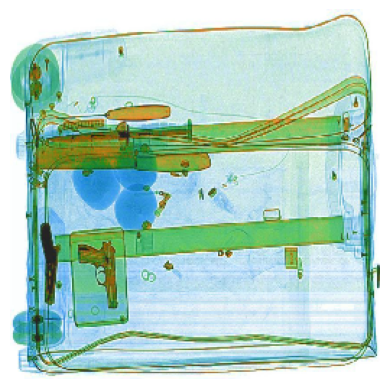

(256, 256, 3)
[0. 1.]


In [6]:
img_n = 365
plt.axis("off")
# plt.imshow(apply_color(train_y[img_n]))
plt.imshow((train_x[img_n] * 255).astype(np.uint8))
plt.show()

print(train_y[img_n].shape)
print(np.unique(train_y[img_n][:,:,2]))

### Visualization of Predicted Mask

In [11]:
class VisualizeEpoch(tf.keras.callbacks.Callback):

    def __init__(self, img_num, **kwargs):
        super().__init__(**kwargs)
        self.img_num = img_num
    
    def on_epoch_end(self, epoch, logs=None):
        img = train_x[self.img_num]
        mask = train_y[self.img_num]
        
        preprocess_img = np.expand_dims(img, axis = 0)
        
        pred_mask = model.predict(preprocess_img)[0]
        pred_mask_thresh = np.where(pred_mask > 0.5, 1, 0)

        plt.figure(figsize=(15, 5))
        plt.subplot(1, 3, 1)
        plt.axis("off")
        plt.title(f"Image {self.img_num}")
        plt.imshow((img * 255).astype(np.uint8))
        
        plt.subplot(1, 3, 2)
        plt.axis("off")
        plt.title("Mask")
        plt.imshow(apply_color(mask))
        
        plt.subplot(1, 3, 3)
        plt.axis("off")
        plt.title("Predicted Mask")
        plt.imshow(apply_color(pred_mask_thresh))

        plt.suptitle(f"Epoch {epoch+1}")
        plt.show()

In [12]:
class ConfusionMatrixCallback(tf.keras.callbacks.Callback):
    def __init__(self, validation_data, num_classes):
        super().__init__()
        self.validation_data = validation_data
        self.num_classes = num_classes

    def on_epoch_end(self, epoch, logs=None):
        val_data, val_labels = self.validation_data
        val_preds = self.model.predict(val_data)
        
        # Convert predictions and labels to categorical form
        val_preds = np.argmax(val_preds, axis=-1).flatten()
        val_labels = np.argmax(val_labels, axis=-1).flatten()
        
        cm = confusion_matrix(val_labels, val_preds, labels=np.arange(self.num_classes))
        print(f'\nConfusion Matrix at epoch {epoch+1}:')
        print(cm)

## Model Compiling

### HyperParameters

In [14]:
input_shape = (X_SIZE, Y_SIZE, 3)
batch_size = 4
epochs = 100
lr = 1e-4
model_path = "dip_unet.h5"
csv_path = "data.csv"

### Class Weights

In [7]:
# print(train_y.shape)

# train_y_flat = np.argmax(train_y, axis=-1).flatten()

# print(train_y_flat.shape)
# print(np.unique(train_y_flat))

# class_weights = class_weight.compute_class_weight('balanced', classes=np.unique(train_y_flat), y = train_y_flat)
# print(class_weights.shape)

# print(f"Class Weights: {class_weights}")

class_weights = [0.35595721, 10.59244675, 10.38780955]

### Building Model

In [16]:
model = build_unet(input_shape)
model.compile(
    loss=weighted_categorical_crossentropy(class_weights),
    optimizer = tf.keras.optimizers.Adam(lr),
    metrics = [
        tf.keras.metrics.OneHotMeanIoU(num_classes=num_classes),
        tf.keras.metrics.CategoricalAccuracy(),
        f1_score
    ]
)

In [17]:
callbacks = [
    ModelCheckpoint(model_path, monitor="val_loss", verbose=1),
    ReduceLROnPlateau(monitor="val_loss", patience=6, factor=0.1, verbose=1),
    CSVLogger(csv_path),
    EarlyStopping(monitor="val_loss", patience=10),
    VisualizeEpoch(img_num=367)
]

In [18]:
train_steps = len(train_x)//batch_size
if len(train_x) % batch_size != 0:
    train_steps += 1

test_steps = len(test_x)//batch_size
if len(test_x) % batch_size != 0:
    test_steps += 1

In [19]:
# model.summary()

Epoch 1/100
170/170 [==============================] - ETA: 0s - loss: 0.5940 - one_hot_mean_io_u: 0.4437 - categorical_accuracy: 0.8714 - f1_score: 0.5250
Epoch 1: saving model to dip_unet.h5
1/1 [==============================] - 0s 374ms/step


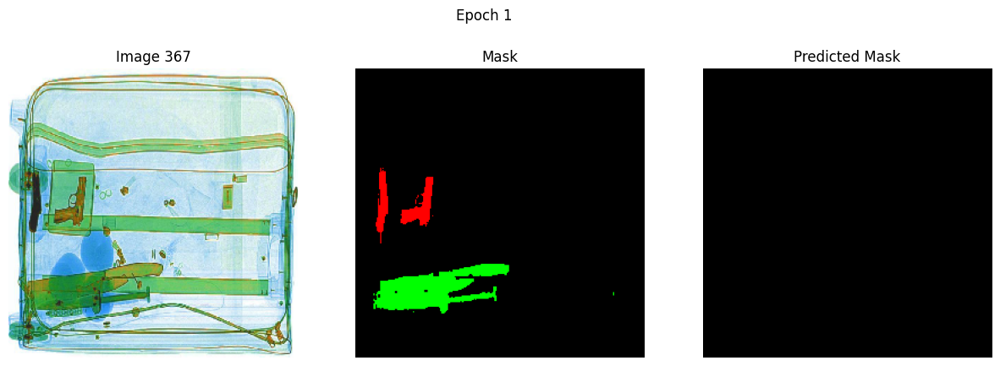

170/170 [==============================] - 62s 313ms/step - loss: 0.5940 - one_hot_mean_io_u: 0.4437 - categorical_accuracy: 0.8714 - f1_score: 0.5250 - val_loss: 1.2324 - val_one_hot_mean_io_u: 0.3181 - val_categorical_accuracy: 0.9544 - val_f1_score: 0.3253 - lr: 1.0000e-04
Epoch 2/100
170/170 [==============================] - ETA: 0s - loss: 0.3762 - one_hot_mean_io_u: 0.5407 - categorical_accuracy: 0.9117 - f1_score: 0.6115
Epoch 2: saving model to dip_unet.h5
1/1 [==============================] - 0s 20ms/step


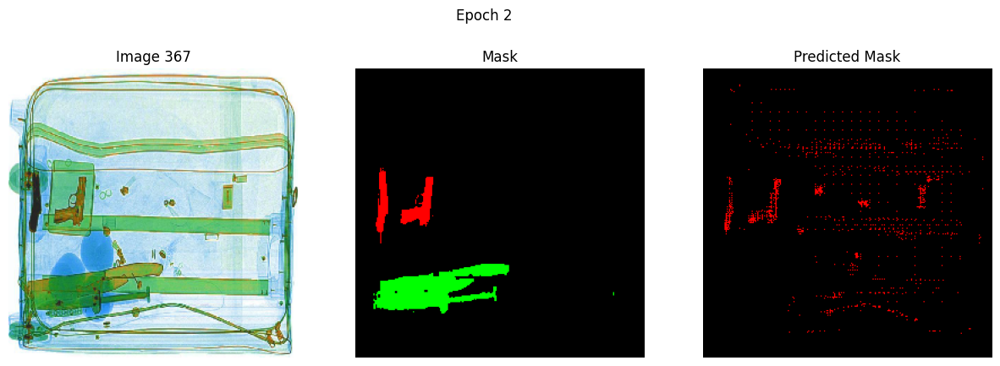

170/170 [==============================] - 48s 285ms/step - loss: 0.3762 - one_hot_mean_io_u: 0.5407 - categorical_accuracy: 0.9117 - f1_score: 0.6115 - val_loss: 1.0632 - val_one_hot_mean_io_u: 0.3909 - val_categorical_accuracy: 0.9390 - val_f1_score: 0.4058 - lr: 1.0000e-04
Epoch 3/100
170/170 [==============================] - ETA: 0s - loss: 0.3179 - one_hot_mean_io_u: 0.5559 - categorical_accuracy: 0.9160 - f1_score: 0.6251
Epoch 3: saving model to dip_unet.h5
1/1 [==============================] - 0s 21ms/step


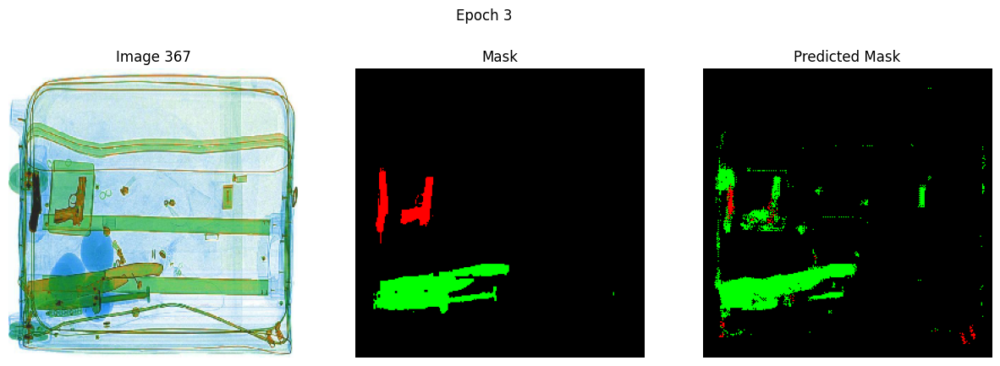

170/170 [==============================] - 48s 284ms/step - loss: 0.3179 - one_hot_mean_io_u: 0.5559 - categorical_accuracy: 0.9160 - f1_score: 0.6251 - val_loss: 0.3837 - val_one_hot_mean_io_u: 0.5024 - val_categorical_accuracy: 0.9238 - val_f1_score: 0.5229 - lr: 1.0000e-04
Epoch 4/100
170/170 [==============================] - ETA: 0s - loss: 0.2374 - one_hot_mean_io_u: 0.5923 - categorical_accuracy: 0.9251 - f1_score: 0.6548
Epoch 4: saving model to dip_unet.h5
1/1 [==============================] - 0s 22ms/step


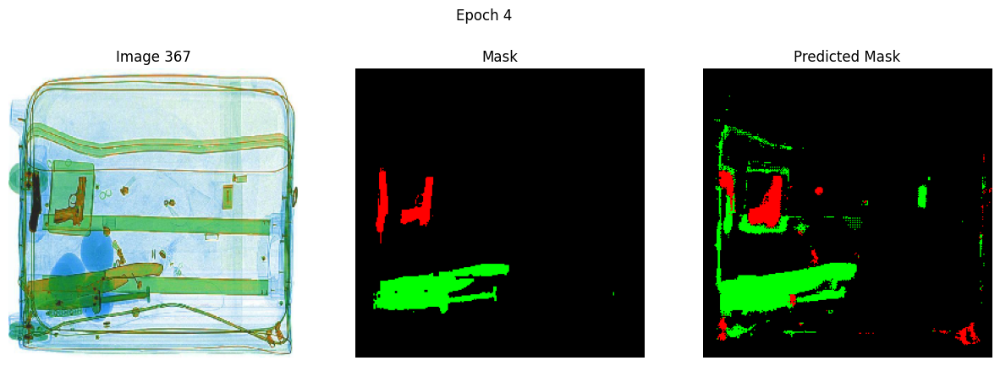

170/170 [==============================] - 48s 285ms/step - loss: 0.2374 - one_hot_mean_io_u: 0.5923 - categorical_accuracy: 0.9251 - f1_score: 0.6548 - val_loss: 0.2338 - val_one_hot_mean_io_u: 0.5113 - val_categorical_accuracy: 0.9043 - val_f1_score: 0.5310 - lr: 1.0000e-04
Epoch 5/100
170/170 [==============================] - ETA: 0s - loss: 0.1876 - one_hot_mean_io_u: 0.6196 - categorical_accuracy: 0.9331 - f1_score: 0.6774
Epoch 5: saving model to dip_unet.h5
1/1 [==============================] - 0s 21ms/step


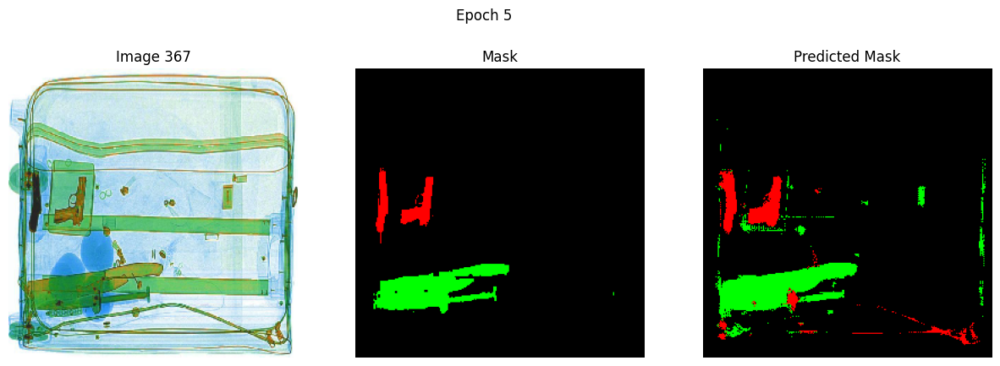

170/170 [==============================] - 49s 285ms/step - loss: 0.1876 - one_hot_mean_io_u: 0.6196 - categorical_accuracy: 0.9331 - f1_score: 0.6774 - val_loss: 0.2348 - val_one_hot_mean_io_u: 0.5290 - val_categorical_accuracy: 0.9113 - val_f1_score: 0.5459 - lr: 1.0000e-04
Epoch 6/100
170/170 [==============================] - ETA: 0s - loss: 0.2904 - one_hot_mean_io_u: 0.5909 - categorical_accuracy: 0.9291 - f1_score: 0.6554
Epoch 6: saving model to dip_unet.h5
1/1 [==============================] - 0s 21ms/step


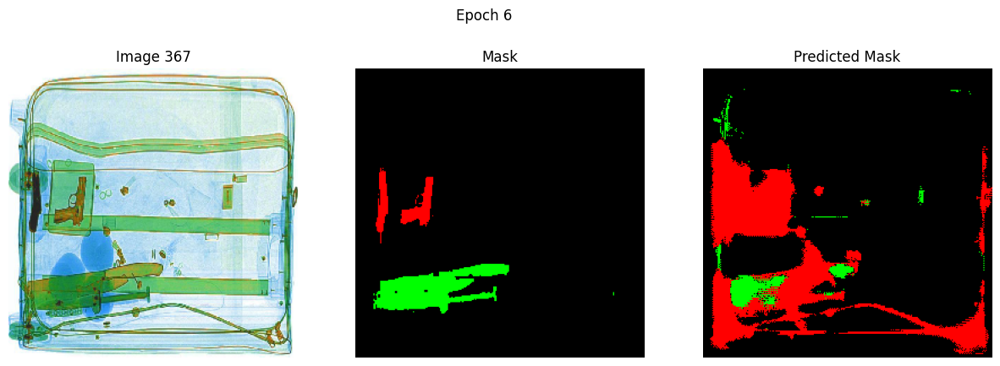

170/170 [==============================] - 48s 284ms/step - loss: 0.2904 - one_hot_mean_io_u: 0.5909 - categorical_accuracy: 0.9291 - f1_score: 0.6554 - val_loss: 1.4005 - val_one_hot_mean_io_u: 0.3879 - val_categorical_accuracy: 0.8218 - val_f1_score: 0.4121 - lr: 1.0000e-04
Epoch 7/100
170/170 [==============================] - ETA: 0s - loss: 0.2309 - one_hot_mean_io_u: 0.6188 - categorical_accuracy: 0.9351 - f1_score: 0.6765
Epoch 7: saving model to dip_unet.h5
1/1 [==============================] - 0s 21ms/step


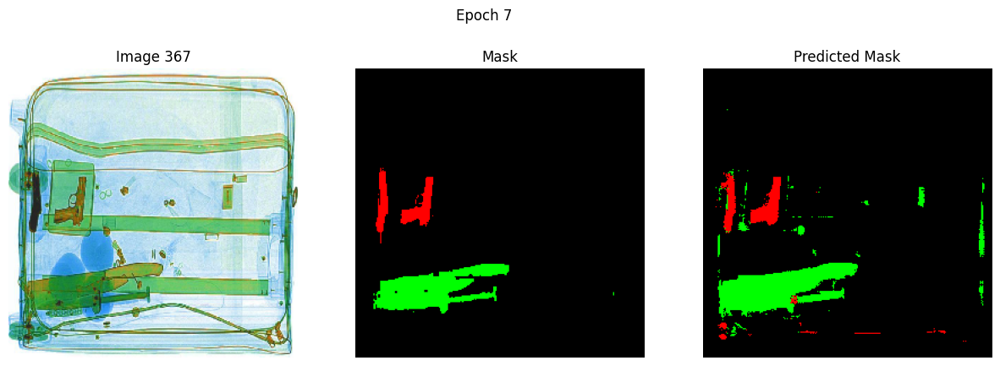

170/170 [==============================] - 49s 286ms/step - loss: 0.2309 - one_hot_mean_io_u: 0.6188 - categorical_accuracy: 0.9351 - f1_score: 0.6765 - val_loss: 0.2168 - val_one_hot_mean_io_u: 0.5428 - val_categorical_accuracy: 0.9233 - val_f1_score: 0.5661 - lr: 1.0000e-04
Epoch 8/100
170/170 [==============================] - ETA: 0s - loss: 0.1690 - one_hot_mean_io_u: 0.6434 - categorical_accuracy: 0.9405 - f1_score: 0.6988
Epoch 8: saving model to dip_unet.h5
1/1 [==============================] - 0s 21ms/step


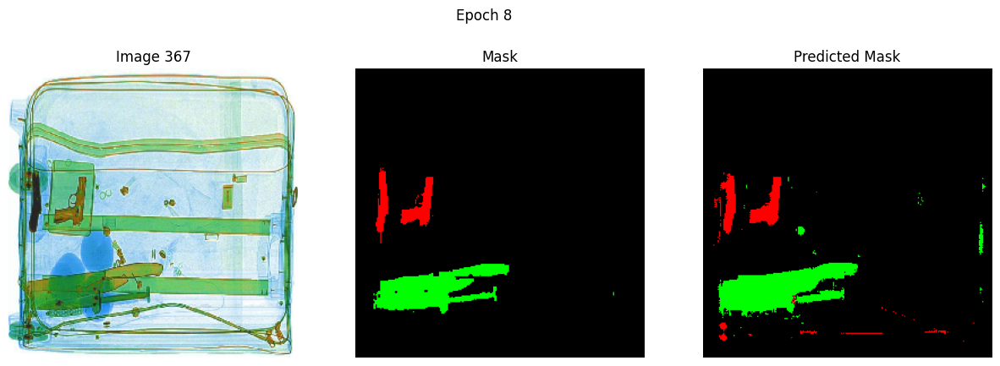

170/170 [==============================] - 49s 286ms/step - loss: 0.1690 - one_hot_mean_io_u: 0.6434 - categorical_accuracy: 0.9405 - f1_score: 0.6988 - val_loss: 0.2046 - val_one_hot_mean_io_u: 0.5686 - val_categorical_accuracy: 0.9292 - val_f1_score: 0.5738 - lr: 1.0000e-04
Epoch 9/100
170/170 [==============================] - ETA: 0s - loss: 0.1791 - one_hot_mean_io_u: 0.6232 - categorical_accuracy: 0.9339 - f1_score: 0.6877
Epoch 9: saving model to dip_unet.h5
1/1 [==============================] - 0s 22ms/step


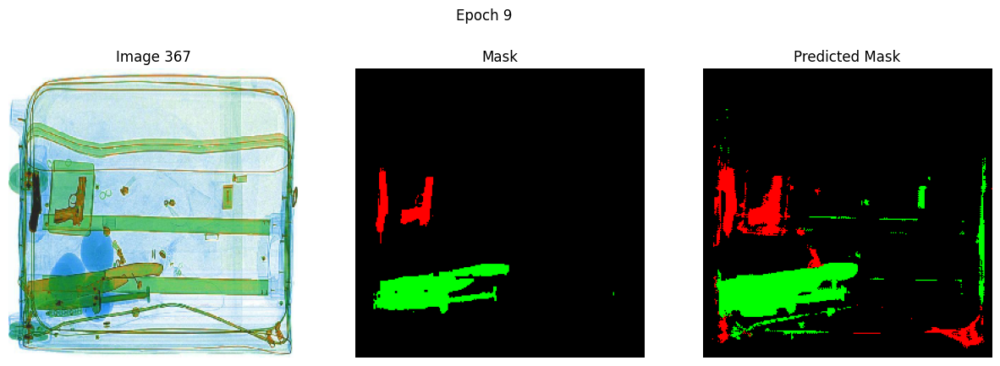

170/170 [==============================] - 48s 285ms/step - loss: 0.1791 - one_hot_mean_io_u: 0.6232 - categorical_accuracy: 0.9339 - f1_score: 0.6877 - val_loss: 0.2598 - val_one_hot_mean_io_u: 0.5423 - val_categorical_accuracy: 0.9023 - val_f1_score: 0.5154 - lr: 1.0000e-04
Epoch 10/100
170/170 [==============================] - ETA: 0s - loss: 0.1503 - one_hot_mean_io_u: 0.6547 - categorical_accuracy: 0.9437 - f1_score: 0.7160
Epoch 10: saving model to dip_unet.h5
1/1 [==============================] - 0s 21ms/step


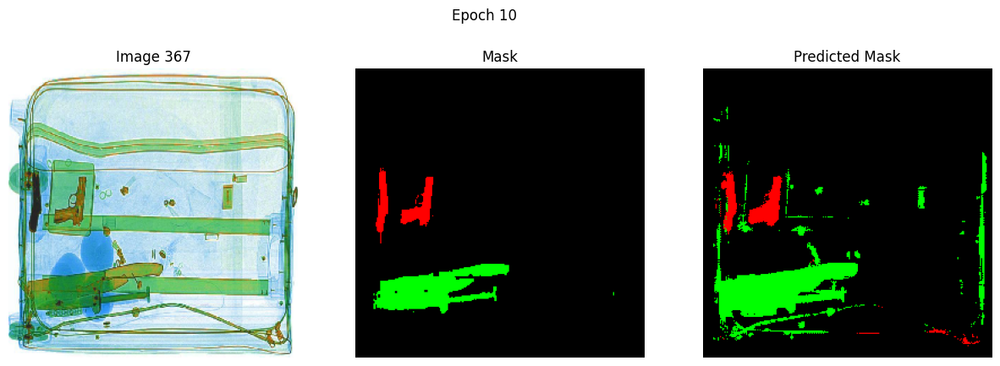

170/170 [==============================] - 48s 285ms/step - loss: 0.1503 - one_hot_mean_io_u: 0.6547 - categorical_accuracy: 0.9437 - f1_score: 0.7160 - val_loss: 0.2047 - val_one_hot_mean_io_u: 0.5273 - val_categorical_accuracy: 0.9140 - val_f1_score: 0.5551 - lr: 1.0000e-04
Epoch 11/100
170/170 [==============================] - ETA: 0s - loss: 0.1839 - one_hot_mean_io_u: 0.6353 - categorical_accuracy: 0.9388 - f1_score: 0.7030
Epoch 11: saving model to dip_unet.h5
1/1 [==============================] - 0s 19ms/step


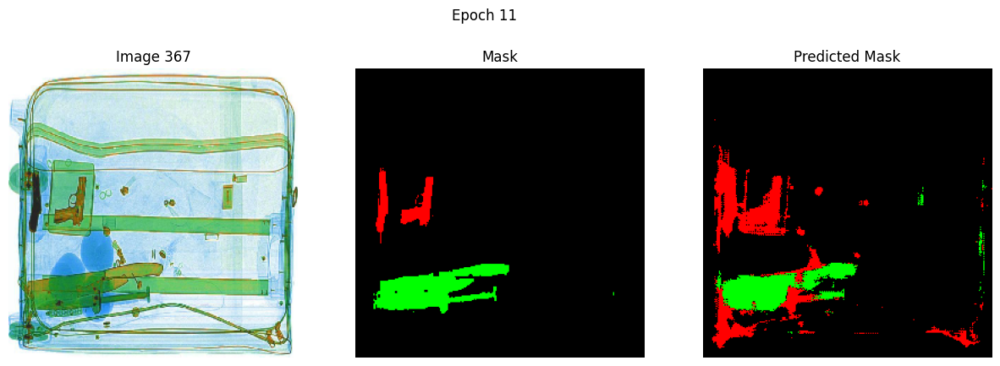

170/170 [==============================] - 48s 285ms/step - loss: 0.1839 - one_hot_mean_io_u: 0.6353 - categorical_accuracy: 0.9388 - f1_score: 0.7030 - val_loss: 0.3267 - val_one_hot_mean_io_u: 0.5436 - val_categorical_accuracy: 0.9012 - val_f1_score: 0.5022 - lr: 1.0000e-04
Epoch 12/100
170/170 [==============================] - ETA: 0s - loss: 0.1686 - one_hot_mean_io_u: 0.6475 - categorical_accuracy: 0.9424 - f1_score: 0.7026
Epoch 12: saving model to dip_unet.h5
1/1 [==============================] - 0s 22ms/step


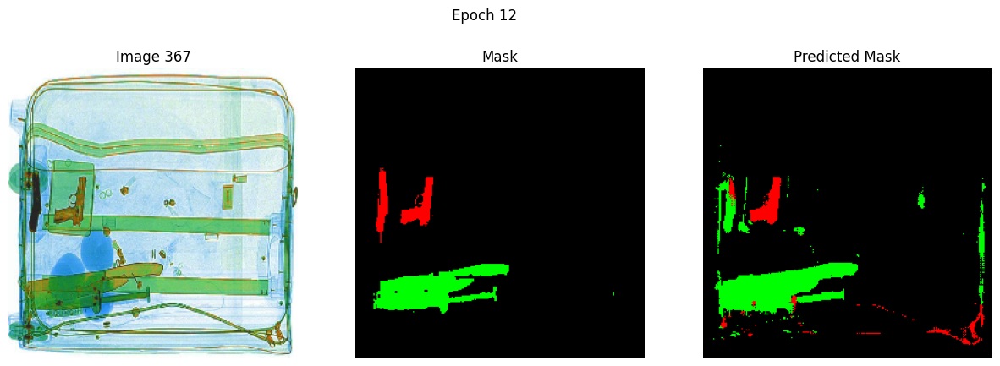

170/170 [==============================] - 48s 285ms/step - loss: 0.1686 - one_hot_mean_io_u: 0.6475 - categorical_accuracy: 0.9424 - f1_score: 0.7026 - val_loss: 0.3199 - val_one_hot_mean_io_u: 0.5248 - val_categorical_accuracy: 0.9180 - val_f1_score: 0.5623 - lr: 1.0000e-04
Epoch 13/100
170/170 [==============================] - ETA: 0s - loss: 0.1658 - one_hot_mean_io_u: 0.6522 - categorical_accuracy: 0.9441 - f1_score: 0.7109
Epoch 13: saving model to dip_unet.h5
1/1 [==============================] - 0s 20ms/step


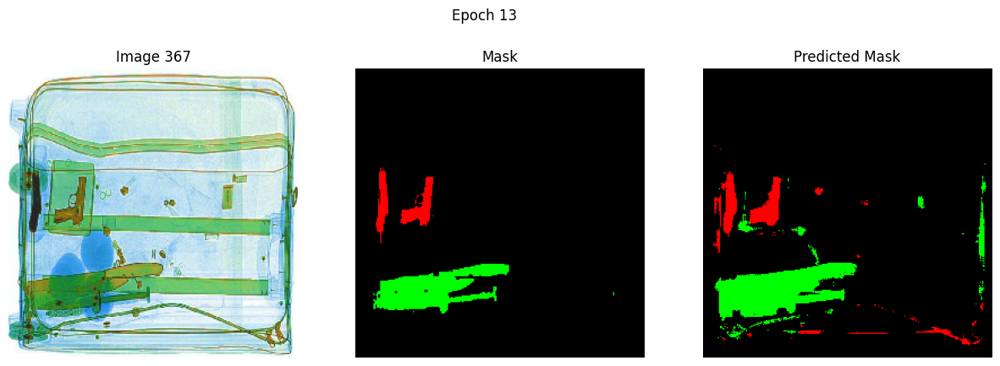

170/170 [==============================] - 48s 285ms/step - loss: 0.1658 - one_hot_mean_io_u: 0.6522 - categorical_accuracy: 0.9441 - f1_score: 0.7109 - val_loss: 0.2100 - val_one_hot_mean_io_u: 0.5481 - val_categorical_accuracy: 0.9162 - val_f1_score: 0.5543 - lr: 1.0000e-04
Epoch 14/100
170/170 [==============================] - ETA: 0s - loss: 0.1546 - one_hot_mean_io_u: 0.6649 - categorical_accuracy: 0.9476 - f1_score: 0.7074
Epoch 14: saving model to dip_unet.h5

Epoch 14: ReduceLROnPlateau reducing learning rate to 9.999999747378752e-06.
1/1 [==============================] - 0s 23ms/step


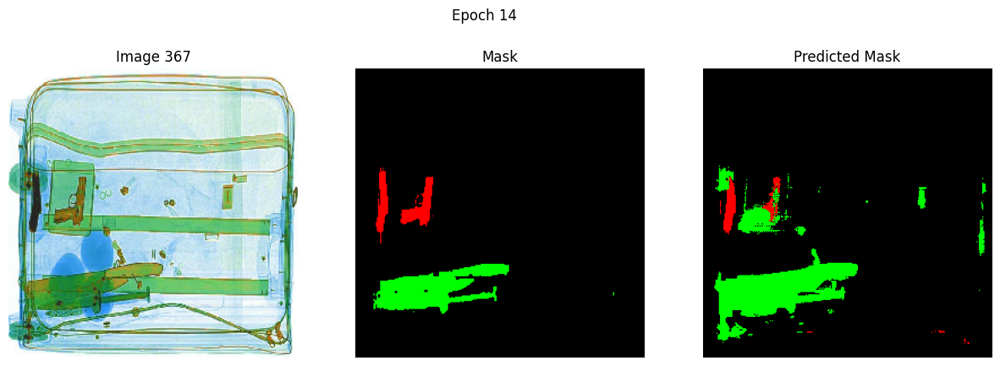

170/170 [==============================] - 48s 285ms/step - loss: 0.1546 - one_hot_mean_io_u: 0.6649 - categorical_accuracy: 0.9476 - f1_score: 0.7074 - val_loss: 0.2764 - val_one_hot_mean_io_u: 0.5088 - val_categorical_accuracy: 0.9113 - val_f1_score: 0.5480 - lr: 1.0000e-04
Epoch 15/100
170/170 [==============================] - ETA: 0s - loss: 0.1291 - one_hot_mean_io_u: 0.6563 - categorical_accuracy: 0.9430 - f1_score: 0.7246
Epoch 15: saving model to dip_unet.h5
1/1 [==============================] - 0s 21ms/step


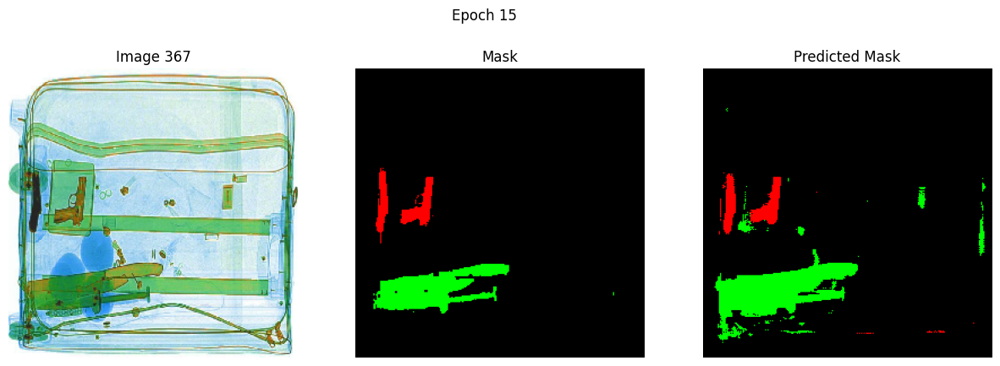

170/170 [==============================] - 48s 285ms/step - loss: 0.1291 - one_hot_mean_io_u: 0.6563 - categorical_accuracy: 0.9430 - f1_score: 0.7246 - val_loss: 0.1950 - val_one_hot_mean_io_u: 0.5460 - val_categorical_accuracy: 0.9236 - val_f1_score: 0.5786 - lr: 1.0000e-05
Epoch 16/100
170/170 [==============================] - ETA: 0s - loss: 0.1145 - one_hot_mean_io_u: 0.6817 - categorical_accuracy: 0.9502 - f1_score: 0.7423
Epoch 16: saving model to dip_unet.h5
1/1 [==============================] - 0s 24ms/step


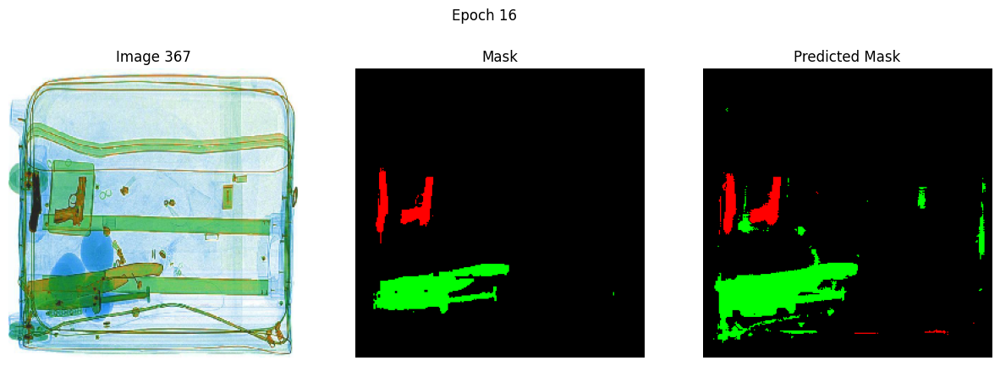

170/170 [==============================] - 48s 285ms/step - loss: 0.1145 - one_hot_mean_io_u: 0.6817 - categorical_accuracy: 0.9502 - f1_score: 0.7423 - val_loss: 0.1985 - val_one_hot_mean_io_u: 0.5422 - val_categorical_accuracy: 0.9220 - val_f1_score: 0.5768 - lr: 1.0000e-05
Epoch 17/100
170/170 [==============================] - ETA: 0s - loss: 0.1113 - one_hot_mean_io_u: 0.6914 - categorical_accuracy: 0.9526 - f1_score: 0.7447
Epoch 17: saving model to dip_unet.h5
1/1 [==============================] - 0s 20ms/step


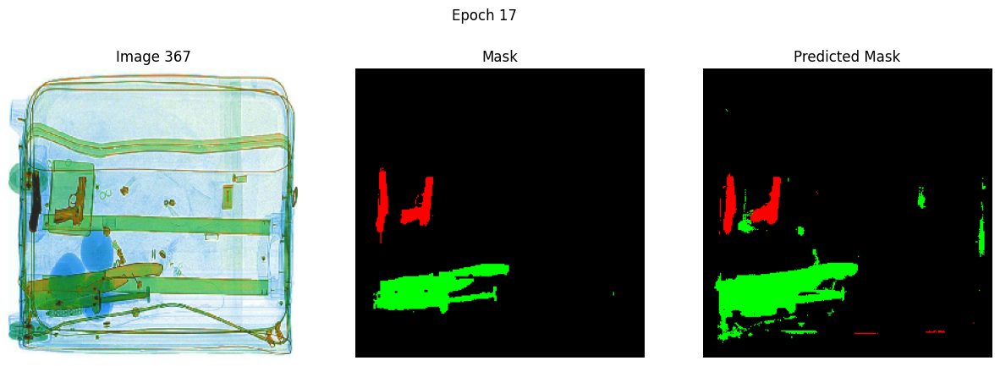

170/170 [==============================] - 48s 285ms/step - loss: 0.1113 - one_hot_mean_io_u: 0.6914 - categorical_accuracy: 0.9526 - f1_score: 0.7447 - val_loss: 0.2071 - val_one_hot_mean_io_u: 0.5496 - val_categorical_accuracy: 0.9265 - val_f1_score: 0.5812 - lr: 1.0000e-05
Epoch 18/100
170/170 [==============================] - ETA: 0s - loss: 0.1125 - one_hot_mean_io_u: 0.6992 - categorical_accuracy: 0.9548 - f1_score: 0.7496
Epoch 18: saving model to dip_unet.h5
1/1 [==============================] - 0s 23ms/step


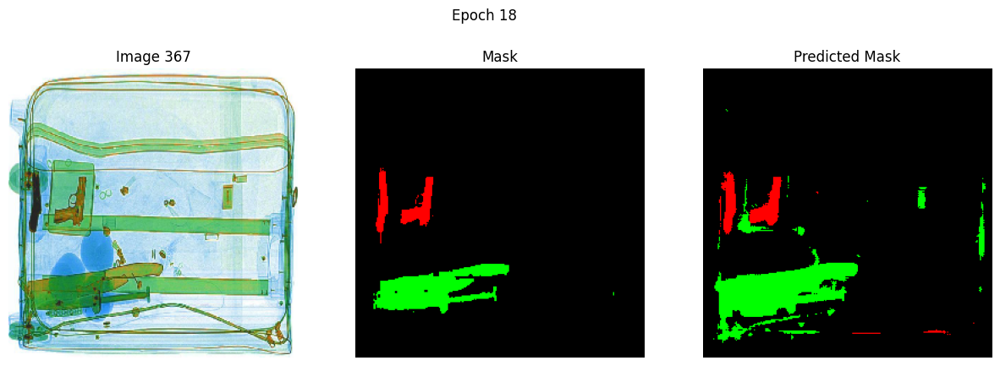

170/170 [==============================] - 49s 286ms/step - loss: 0.1125 - one_hot_mean_io_u: 0.6992 - categorical_accuracy: 0.9548 - f1_score: 0.7496 - val_loss: 0.2080 - val_one_hot_mean_io_u: 0.5375 - val_categorical_accuracy: 0.9201 - val_f1_score: 0.5745 - lr: 1.0000e-05
Epoch 19/100
170/170 [==============================] - ETA: 0s - loss: 0.1092 - one_hot_mean_io_u: 0.6975 - categorical_accuracy: 0.9544 - f1_score: 0.7444
Epoch 19: saving model to dip_unet.h5
1/1 [==============================] - 0s 21ms/step


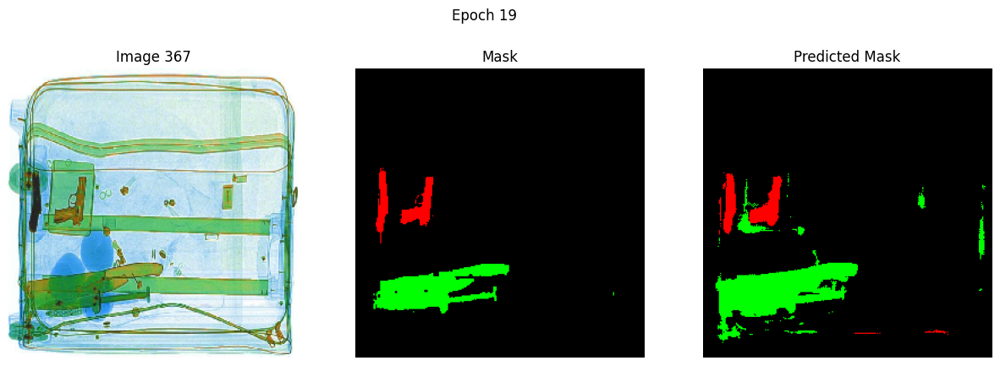

170/170 [==============================] - 48s 284ms/step - loss: 0.1092 - one_hot_mean_io_u: 0.6975 - categorical_accuracy: 0.9544 - f1_score: 0.7444 - val_loss: 0.2037 - val_one_hot_mean_io_u: 0.5413 - val_categorical_accuracy: 0.9215 - val_f1_score: 0.5770 - lr: 1.0000e-05
Epoch 20/100
170/170 [==============================] - ETA: 0s - loss: 0.1053 - one_hot_mean_io_u: 0.6956 - categorical_accuracy: 0.9535 - f1_score: 0.7473
Epoch 20: saving model to dip_unet.h5
1/1 [==============================] - 0s 21ms/step


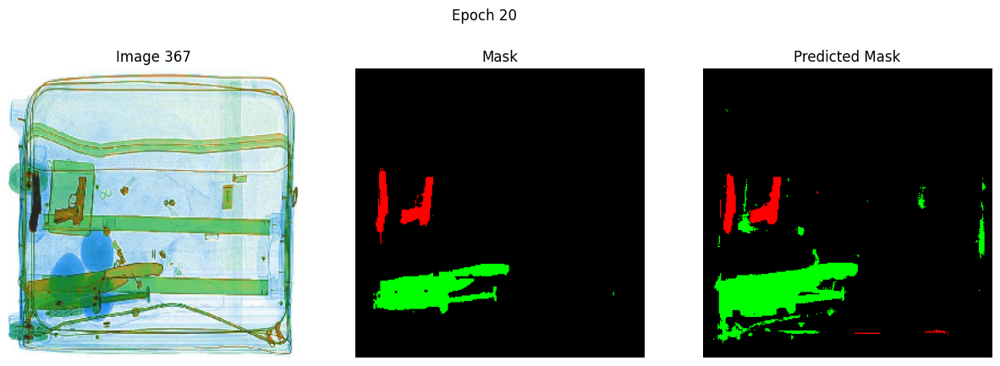

170/170 [==============================] - 48s 285ms/step - loss: 0.1053 - one_hot_mean_io_u: 0.6956 - categorical_accuracy: 0.9535 - f1_score: 0.7473 - val_loss: 0.2003 - val_one_hot_mean_io_u: 0.5475 - val_categorical_accuracy: 0.9248 - val_f1_score: 0.5829 - lr: 1.0000e-05
Epoch 21/100
170/170 [==============================] - ETA: 0s - loss: 0.0990 - one_hot_mean_io_u: 0.7032 - categorical_accuracy: 0.9554 - f1_score: 0.7593
Epoch 21: saving model to dip_unet.h5
1/1 [==============================] - 0s 23ms/step


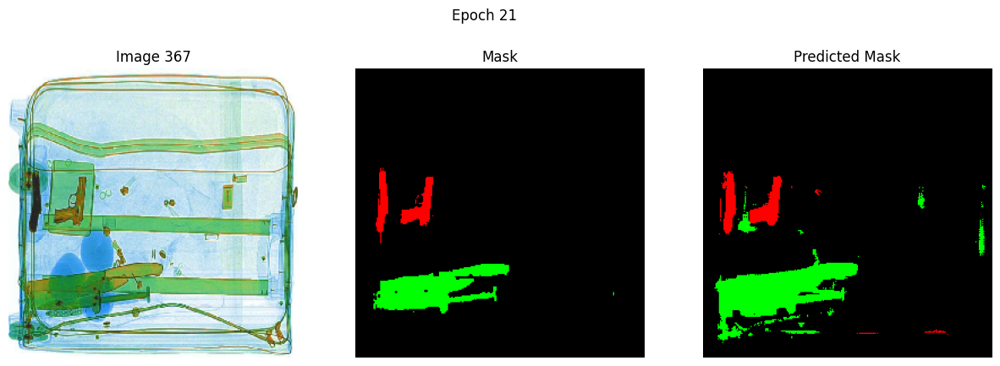

170/170 [==============================] - 49s 286ms/step - loss: 0.0990 - one_hot_mean_io_u: 0.7032 - categorical_accuracy: 0.9554 - f1_score: 0.7593 - val_loss: 0.1819 - val_one_hot_mean_io_u: 0.5461 - val_categorical_accuracy: 0.9241 - val_f1_score: 0.5734 - lr: 1.0000e-05
Epoch 22/100
170/170 [==============================] - ETA: 0s - loss: 0.1001 - one_hot_mean_io_u: 0.7069 - categorical_accuracy: 0.9562 - f1_score: 0.7513
Epoch 22: saving model to dip_unet.h5
1/1 [==============================] - 0s 24ms/step


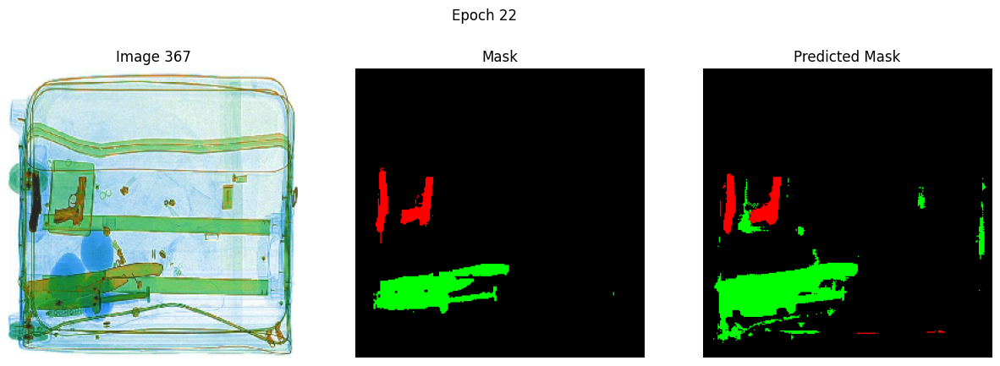

170/170 [==============================] - 52s 304ms/step - loss: 0.1001 - one_hot_mean_io_u: 0.7069 - categorical_accuracy: 0.9562 - f1_score: 0.7513 - val_loss: 0.1996 - val_one_hot_mean_io_u: 0.5473 - val_categorical_accuracy: 0.9247 - val_f1_score: 0.5818 - lr: 1.0000e-05
Epoch 23/100
170/170 [==============================] - ETA: 0s - loss: 0.0965 - one_hot_mean_io_u: 0.7085 - categorical_accuracy: 0.9569 - f1_score: 0.7537
Epoch 23: saving model to dip_unet.h5
1/1 [==============================] - 0s 25ms/step


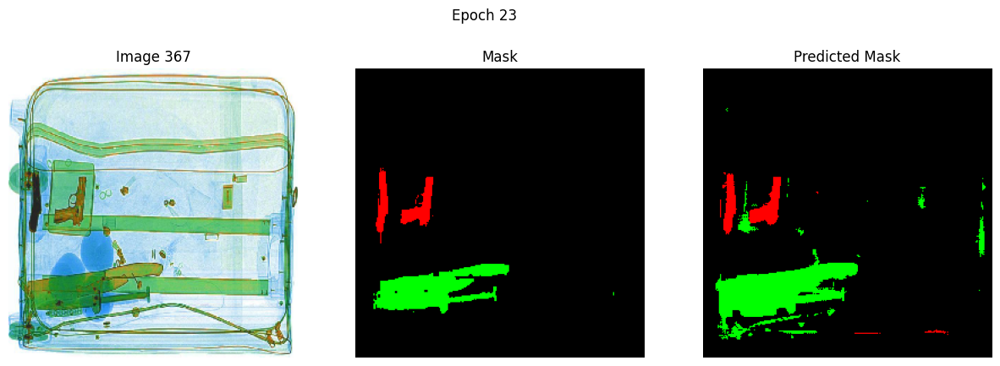

170/170 [==============================] - 52s 305ms/step - loss: 0.0965 - one_hot_mean_io_u: 0.7085 - categorical_accuracy: 0.9569 - f1_score: 0.7537 - val_loss: 0.1876 - val_one_hot_mean_io_u: 0.5559 - val_categorical_accuracy: 0.9269 - val_f1_score: 0.5815 - lr: 1.0000e-05
Epoch 24/100
170/170 [==============================] - ETA: 0s - loss: 0.0986 - one_hot_mean_io_u: 0.7144 - categorical_accuracy: 0.9580 - f1_score: 0.7501
Epoch 24: saving model to dip_unet.h5
1/1 [==============================] - 0s 34ms/step


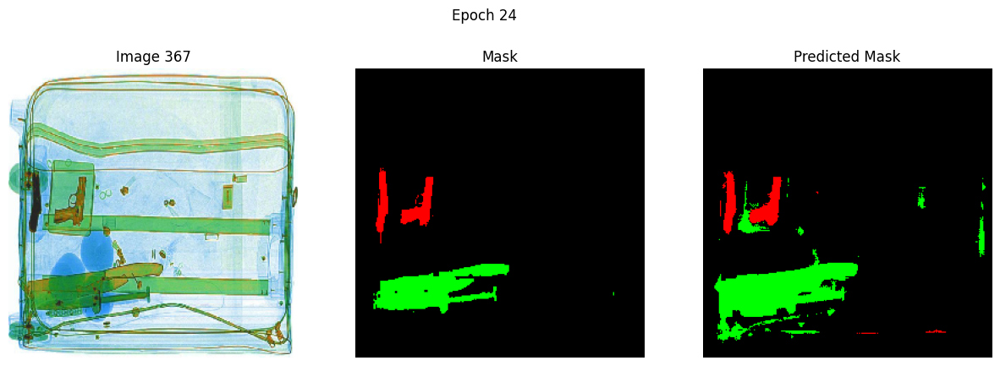

170/170 [==============================] - 51s 302ms/step - loss: 0.0986 - one_hot_mean_io_u: 0.7144 - categorical_accuracy: 0.9580 - f1_score: 0.7501 - val_loss: 0.1900 - val_one_hot_mean_io_u: 0.5449 - val_categorical_accuracy: 0.9231 - val_f1_score: 0.5798 - lr: 1.0000e-05
Epoch 25/100
170/170 [==============================] - ETA: 0s - loss: 0.0941 - one_hot_mean_io_u: 0.7115 - categorical_accuracy: 0.9574 - f1_score: 0.7531
Epoch 25: saving model to dip_unet.h5
1/1 [==============================] - 0s 27ms/step


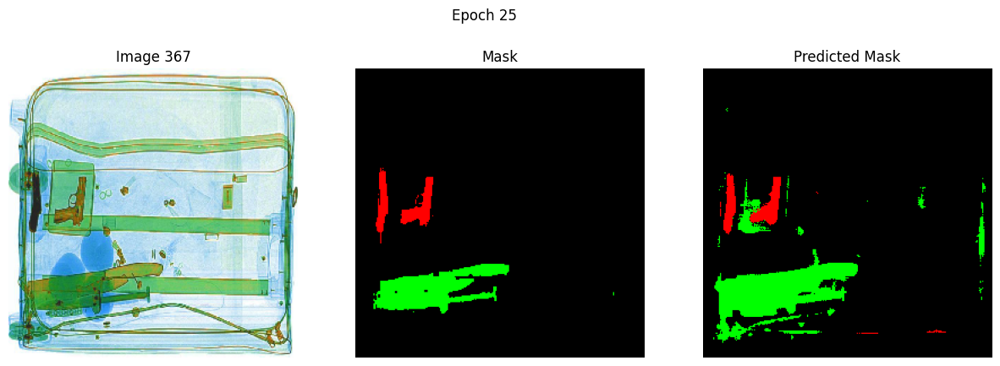

170/170 [==============================] - 52s 308ms/step - loss: 0.0941 - one_hot_mean_io_u: 0.7115 - categorical_accuracy: 0.9574 - f1_score: 0.7531 - val_loss: 0.2100 - val_one_hot_mean_io_u: 0.5399 - val_categorical_accuracy: 0.9220 - val_f1_score: 0.5789 - lr: 1.0000e-05
Epoch 26/100
170/170 [==============================] - ETA: 0s - loss: 0.0908 - one_hot_mean_io_u: 0.7201 - categorical_accuracy: 0.9596 - f1_score: 0.7620
Epoch 26: saving model to dip_unet.h5
1/1 [==============================] - 0s 25ms/step


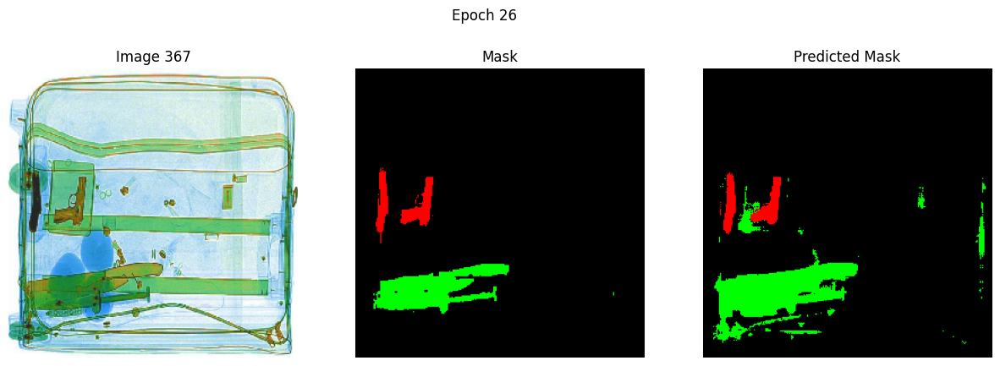

170/170 [==============================] - 51s 298ms/step - loss: 0.0908 - one_hot_mean_io_u: 0.7201 - categorical_accuracy: 0.9596 - f1_score: 0.7620 - val_loss: 0.2024 - val_one_hot_mean_io_u: 0.5463 - val_categorical_accuracy: 0.9248 - val_f1_score: 0.5833 - lr: 1.0000e-05
Epoch 27/100
170/170 [==============================] - ETA: 0s - loss: 0.0861 - one_hot_mean_io_u: 0.7220 - categorical_accuracy: 0.9598 - f1_score: 0.7731
Epoch 27: saving model to dip_unet.h5

Epoch 27: ReduceLROnPlateau reducing learning rate to 9.999999747378752e-07.
1/1 [==============================] - 0s 23ms/step


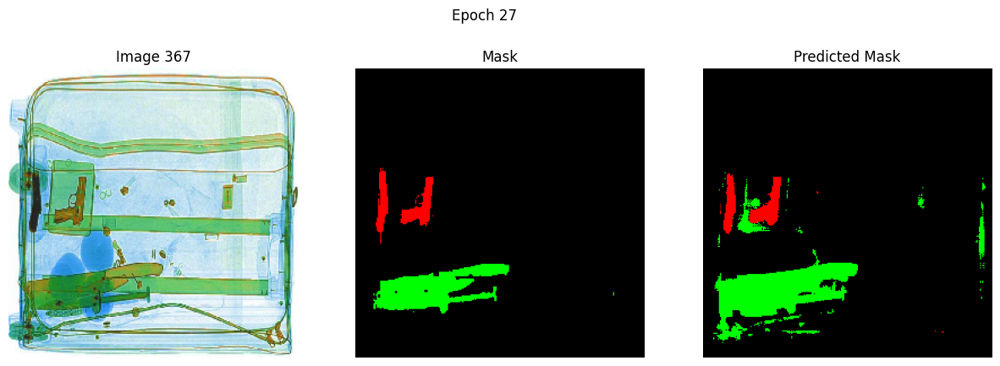

170/170 [==============================] - 50s 297ms/step - loss: 0.0861 - one_hot_mean_io_u: 0.7220 - categorical_accuracy: 0.9598 - f1_score: 0.7731 - val_loss: 0.2018 - val_one_hot_mean_io_u: 0.5478 - val_categorical_accuracy: 0.9249 - val_f1_score: 0.5839 - lr: 1.0000e-05
Epoch 28/100
170/170 [==============================] - ETA: 0s - loss: 0.0833 - one_hot_mean_io_u: 0.7237 - categorical_accuracy: 0.9598 - f1_score: 0.7647
Epoch 28: saving model to dip_unet.h5
1/1 [==============================] - 0s 23ms/step


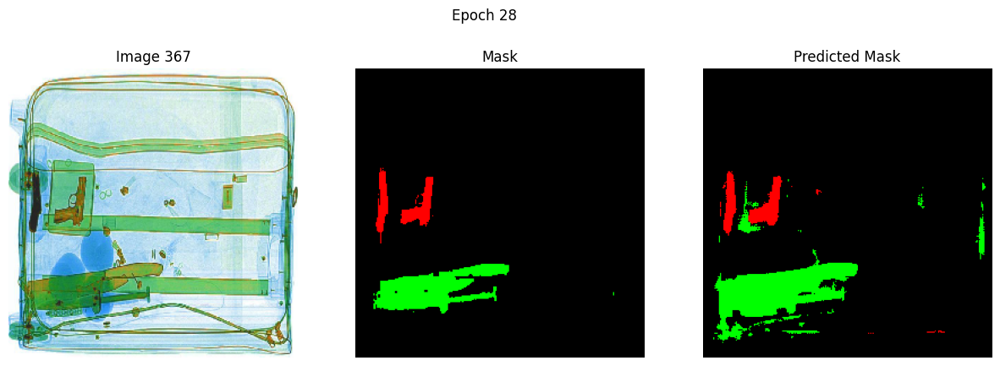

170/170 [==============================] - 51s 298ms/step - loss: 0.0833 - one_hot_mean_io_u: 0.7237 - categorical_accuracy: 0.9598 - f1_score: 0.7647 - val_loss: 0.1895 - val_one_hot_mean_io_u: 0.5507 - val_categorical_accuracy: 0.9251 - val_f1_score: 0.5812 - lr: 1.0000e-06
Epoch 29/100
170/170 [==============================] - ETA: 0s - loss: 0.0803 - one_hot_mean_io_u: 0.7232 - categorical_accuracy: 0.9597 - f1_score: 0.7702
Epoch 29: saving model to dip_unet.h5
1/1 [==============================] - 0s 24ms/step


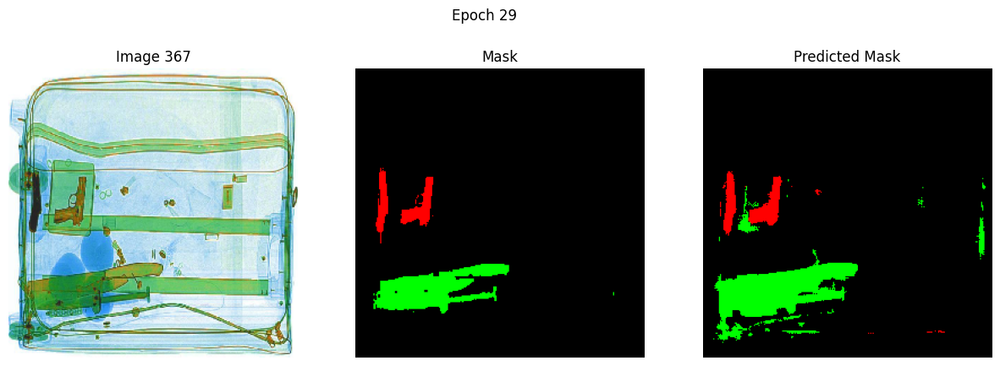

170/170 [==============================] - 51s 299ms/step - loss: 0.0803 - one_hot_mean_io_u: 0.7232 - categorical_accuracy: 0.9597 - f1_score: 0.7702 - val_loss: 0.1863 - val_one_hot_mean_io_u: 0.5535 - val_categorical_accuracy: 0.9261 - val_f1_score: 0.5822 - lr: 1.0000e-06
Epoch 30/100
170/170 [==============================] - ETA: 0s - loss: 0.0825 - one_hot_mean_io_u: 0.7257 - categorical_accuracy: 0.9601 - f1_score: 0.7669
Epoch 30: saving model to dip_unet.h5
1/1 [==============================] - 0s 36ms/step


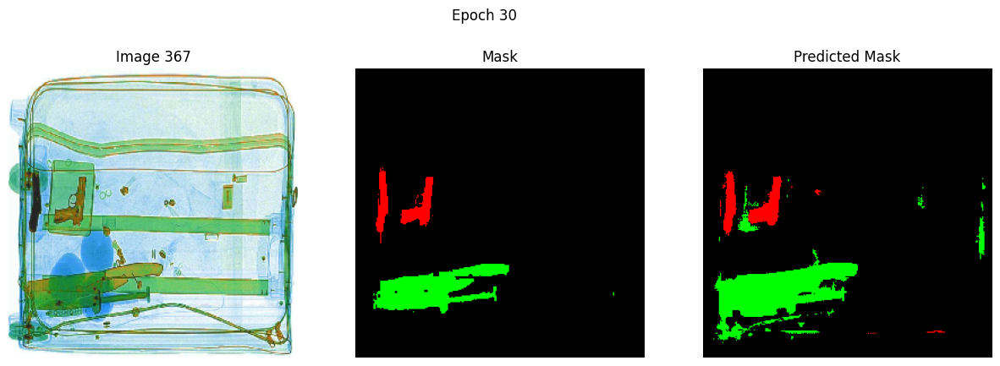

170/170 [==============================] - 51s 303ms/step - loss: 0.0825 - one_hot_mean_io_u: 0.7257 - categorical_accuracy: 0.9601 - f1_score: 0.7669 - val_loss: 0.1839 - val_one_hot_mean_io_u: 0.5527 - val_categorical_accuracy: 0.9250 - val_f1_score: 0.5796 - lr: 1.0000e-06
Epoch 31/100
170/170 [==============================] - ETA: 0s - loss: 0.0821 - one_hot_mean_io_u: 0.7232 - categorical_accuracy: 0.9597 - f1_score: 0.7653
Epoch 31: saving model to dip_unet.h5
1/1 [==============================] - 0s 23ms/step


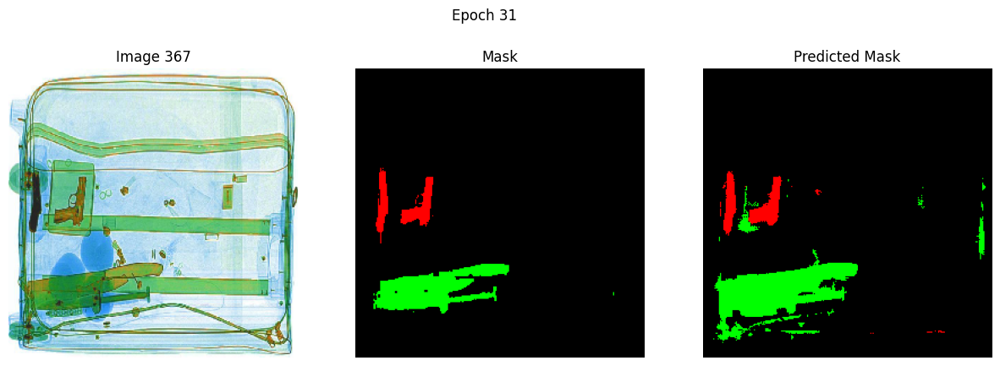

170/170 [==============================] - 51s 300ms/step - loss: 0.0821 - one_hot_mean_io_u: 0.7232 - categorical_accuracy: 0.9597 - f1_score: 0.7653 - val_loss: 0.1818 - val_one_hot_mean_io_u: 0.5531 - val_categorical_accuracy: 0.9258 - val_f1_score: 0.5819 - lr: 1.0000e-06
Epoch 32/100
170/170 [==============================] - ETA: 0s - loss: 0.0801 - one_hot_mean_io_u: 0.7250 - categorical_accuracy: 0.9599 - f1_score: 0.7645
Epoch 32: saving model to dip_unet.h5
1/1 [==============================] - 0s 24ms/step


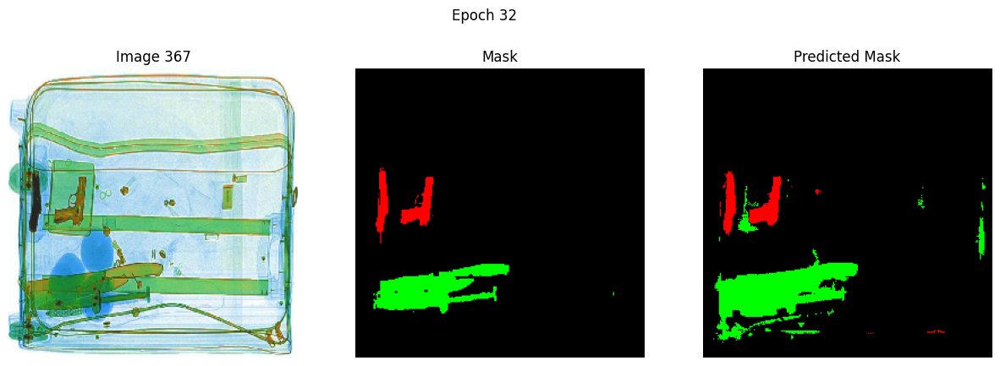

170/170 [==============================] - 51s 298ms/step - loss: 0.0801 - one_hot_mean_io_u: 0.7250 - categorical_accuracy: 0.9599 - f1_score: 0.7645 - val_loss: 0.1824 - val_one_hot_mean_io_u: 0.5545 - val_categorical_accuracy: 0.9261 - val_f1_score: 0.5821 - lr: 1.0000e-06
Epoch 33/100
170/170 [==============================] - ETA: 0s - loss: 0.0806 - one_hot_mean_io_u: 0.7286 - categorical_accuracy: 0.9606 - f1_score: 0.7609
Epoch 33: saving model to dip_unet.h5
1/1 [==============================] - 0s 24ms/step


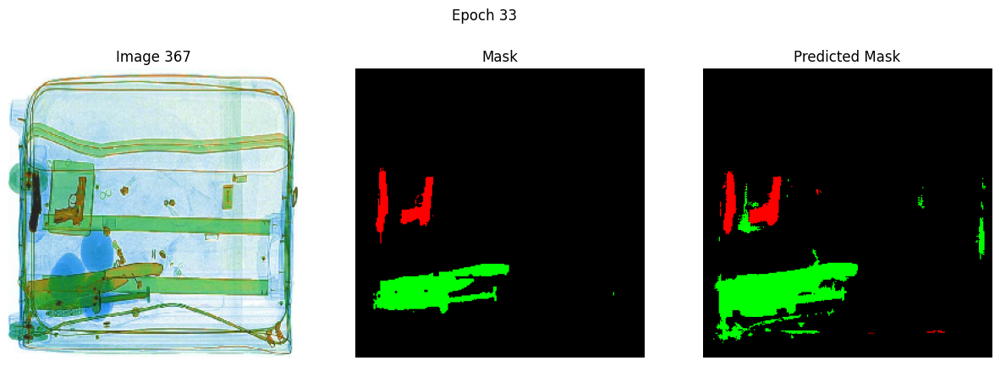

170/170 [==============================] - 51s 298ms/step - loss: 0.0806 - one_hot_mean_io_u: 0.7286 - categorical_accuracy: 0.9606 - f1_score: 0.7609 - val_loss: 0.1813 - val_one_hot_mean_io_u: 0.5543 - val_categorical_accuracy: 0.9263 - val_f1_score: 0.5826 - lr: 1.0000e-06
Epoch 34/100
170/170 [==============================] - ETA: 0s - loss: 0.0792 - one_hot_mean_io_u: 0.7275 - categorical_accuracy: 0.9606 - f1_score: 0.7688
Epoch 34: saving model to dip_unet.h5
1/1 [==============================] - 0s 25ms/step


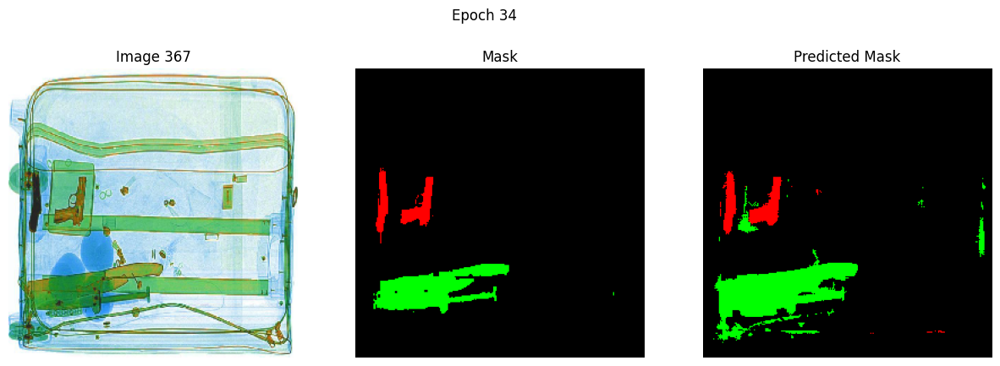

170/170 [==============================] - 51s 302ms/step - loss: 0.0792 - one_hot_mean_io_u: 0.7275 - categorical_accuracy: 0.9606 - f1_score: 0.7688 - val_loss: 0.1832 - val_one_hot_mean_io_u: 0.5554 - val_categorical_accuracy: 0.9269 - val_f1_score: 0.5840 - lr: 1.0000e-06
Epoch 35/100
170/170 [==============================] - ETA: 0s - loss: 0.0850 - one_hot_mean_io_u: 0.7225 - categorical_accuracy: 0.9595 - f1_score: 0.7640
Epoch 35: saving model to dip_unet.h5
1/1 [==============================] - 0s 22ms/step


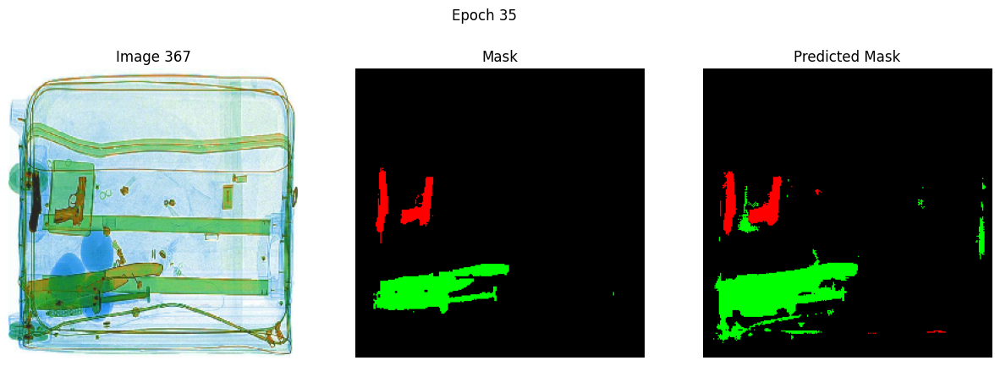

170/170 [==============================] - 51s 300ms/step - loss: 0.0850 - one_hot_mean_io_u: 0.7225 - categorical_accuracy: 0.9595 - f1_score: 0.7640 - val_loss: 0.1854 - val_one_hot_mean_io_u: 0.5516 - val_categorical_accuracy: 0.9251 - val_f1_score: 0.5806 - lr: 1.0000e-06
Epoch 36/100
170/170 [==============================] - ETA: 0s - loss: 0.0820 - one_hot_mean_io_u: 0.7250 - categorical_accuracy: 0.9600 - f1_score: 0.7617
Epoch 36: saving model to dip_unet.h5
1/1 [==============================] - 0s 29ms/step


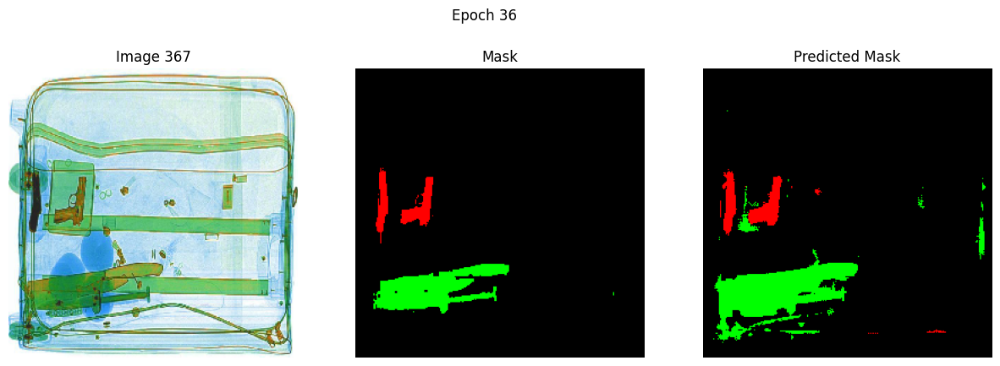

170/170 [==============================] - 51s 300ms/step - loss: 0.0820 - one_hot_mean_io_u: 0.7250 - categorical_accuracy: 0.9600 - f1_score: 0.7617 - val_loss: 0.1828 - val_one_hot_mean_io_u: 0.5528 - val_categorical_accuracy: 0.9249 - val_f1_score: 0.5793 - lr: 1.0000e-06
Epoch 37/100
170/170 [==============================] - ETA: 0s - loss: 0.0808 - one_hot_mean_io_u: 0.7253 - categorical_accuracy: 0.9600 - f1_score: 0.7583
Epoch 37: saving model to dip_unet.h5
1/1 [==============================] - 0s 25ms/step


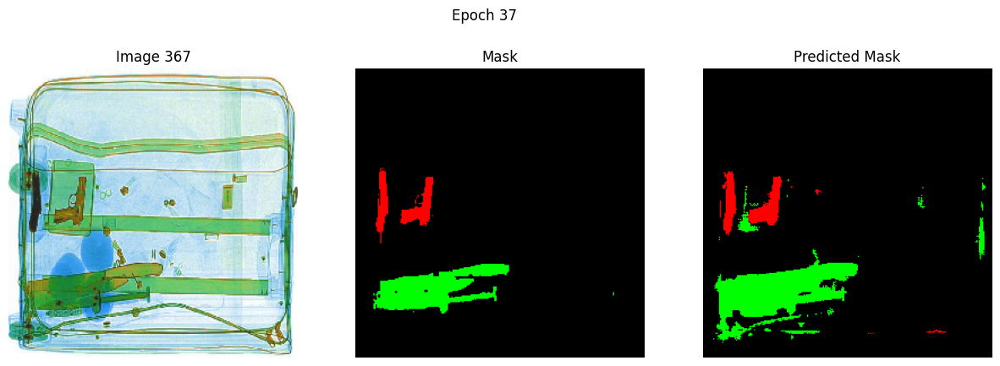

170/170 [==============================] - 50s 297ms/step - loss: 0.0808 - one_hot_mean_io_u: 0.7253 - categorical_accuracy: 0.9600 - f1_score: 0.7583 - val_loss: 0.1826 - val_one_hot_mean_io_u: 0.5521 - val_categorical_accuracy: 0.9251 - val_f1_score: 0.5805 - lr: 1.0000e-06
Epoch 38/100
170/170 [==============================] - ETA: 0s - loss: 0.0769 - one_hot_mean_io_u: 0.7253 - categorical_accuracy: 0.9599 - f1_score: 0.7682
Epoch 38: saving model to dip_unet.h5
1/1 [==============================] - 0s 22ms/step


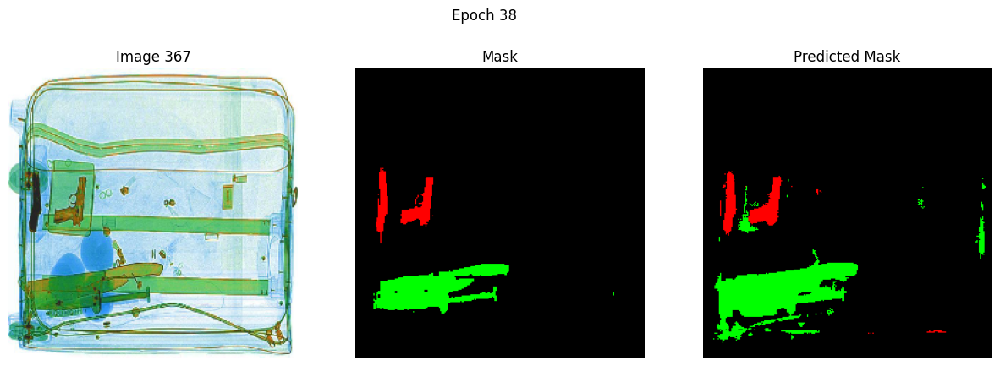

170/170 [==============================] - 51s 299ms/step - loss: 0.0769 - one_hot_mean_io_u: 0.7253 - categorical_accuracy: 0.9599 - f1_score: 0.7682 - val_loss: 0.1851 - val_one_hot_mean_io_u: 0.5529 - val_categorical_accuracy: 0.9259 - val_f1_score: 0.5822 - lr: 1.0000e-06
Epoch 39/100
170/170 [==============================] - ETA: 0s - loss: 0.0804 - one_hot_mean_io_u: 0.7275 - categorical_accuracy: 0.9605 - f1_score: 0.7590
Epoch 39: saving model to dip_unet.h5

Epoch 39: ReduceLROnPlateau reducing learning rate to 9.999999974752428e-08.
1/1 [==============================] - 0s 23ms/step


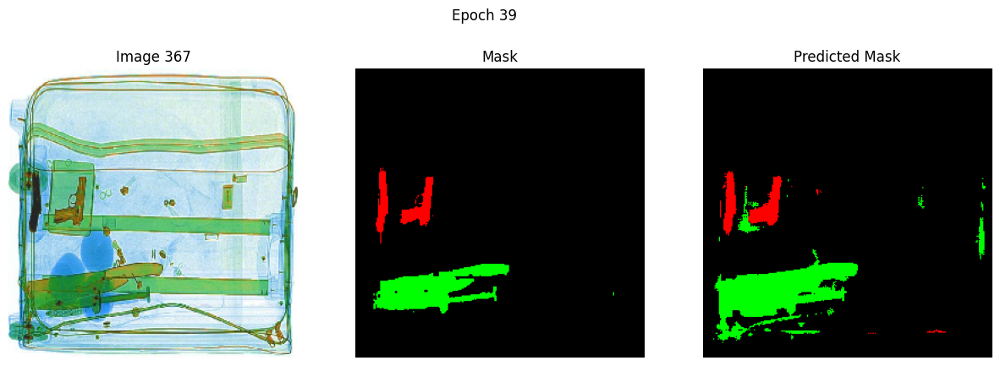

170/170 [==============================] - 50s 297ms/step - loss: 0.0804 - one_hot_mean_io_u: 0.7275 - categorical_accuracy: 0.9605 - f1_score: 0.7590 - val_loss: 0.1886 - val_one_hot_mean_io_u: 0.5511 - val_categorical_accuracy: 0.9251 - val_f1_score: 0.5812 - lr: 1.0000e-06
Epoch 40/100
170/170 [==============================] - ETA: 0s - loss: 0.0785 - one_hot_mean_io_u: 0.7294 - categorical_accuracy: 0.9610 - f1_score: 0.7649
Epoch 40: saving model to dip_unet.h5
1/1 [==============================] - 0s 24ms/step


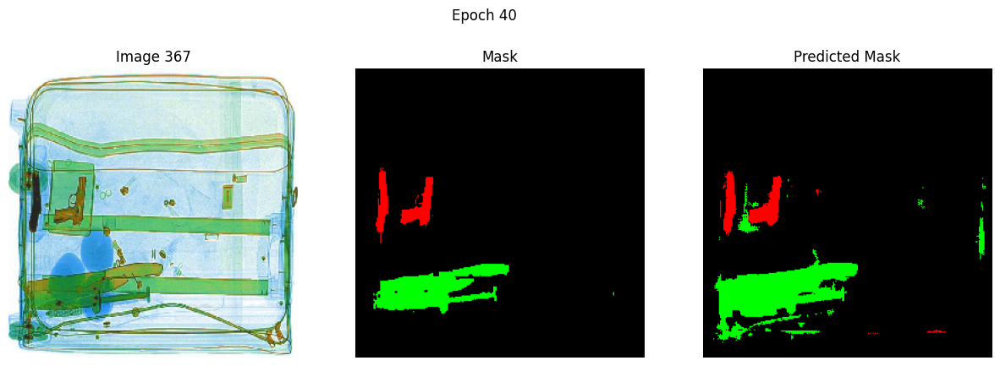

170/170 [==============================] - 51s 297ms/step - loss: 0.0785 - one_hot_mean_io_u: 0.7294 - categorical_accuracy: 0.9610 - f1_score: 0.7649 - val_loss: 0.1886 - val_one_hot_mean_io_u: 0.5524 - val_categorical_accuracy: 0.9255 - val_f1_score: 0.5818 - lr: 1.0000e-07
Epoch 41/100
 13/170 [=>............................] - ETA: 41s - loss: 0.0869 - one_hot_mean_io_u: 0.6018 - categorical_accuracy: 0.9541 - f1_score: 0.7497

KeyboardInterrupt: 

In [20]:
model.fit(
    train_x, train_y,
    batch_size = batch_size,
    validation_data=(test_x, test_y),
    epochs=epochs,
    steps_per_epoch=train_steps,
    validation_steps=test_steps,
    callbacks=callbacks
)

## Predicting Test Masks

In [10]:
# import tensorflow as tf
# import cv2
# import numpy as np
# from glob import glob
# import os

def save_test_predictions(path):
    weights = class_weights
    model = tf.keras.models.load_model(
    "./dip_unet.h5", custom_objects={'loss': weighted_categorical_crossentropy(weights),
                                    'f1_score':f1_score})

    img_paths = sorted(glob(os.path.join(path, "*.png")))
    images = np.zeros([len(img_paths), X_SIZE, Y_SIZE, 3], dtype=np.float32)
    img_dim = []
    
    for i, img_path in enumerate(img_paths):
        img = cv2.imread(img_path)
        img_dim.append(img.shape[:-1])
        
        img = cv2.resize(img, (X_SIZE, Y_SIZE), interpolation=cv2.INTER_NEAREST)
        img = img / 255.0
        images[i] = img

        
        
    pred_masks = model.predict(images)

    for i, (pred_mask, img_path) in enumerate(zip(pred_masks, img_paths)):
        pred_mask_thresh = np.where(pred_mask > 0.5, 1, 0)
        pred_mask_thresh = cv2.resize(
            pred_mask_thresh, (768, 576), interpolation=cv2.INTER_NEAREST)
        
        cv2.imwrite("./test_pred_masks/{}".format(os.path.basename(img_path)), cv2.cvtColor(apply_color(pred_mask_thresh), cv2.COLOR_BGR2RGB))

In [11]:
save_test_predictions("./students_data/cleaned_data/test/img/")

6/6 [==============================] - 21s 1s/step


## Confusion Matrix

In [3]:
def confusion_matrix_calc(label_paths, pred_paths, shape):

    labels = np.zeros(((len(label_paths), ) + shape))
    preds = np.zeros(((len(label_paths), ) + shape))
    
    for i, (label_path, pred_path) in enumerate(zip(label_paths, pred_paths)):
        label = cv2.imread(label_path)
        pred = cv2.imread(pred_path)

        labels[i] = label
        preds[i] = pred
    
    # Convert predictions and labels to categorical form
    val_labels = np.argmax(labels, axis=-1)
    val_preds = np.argmax(preds, axis=-1)
      
    cm = confusion_matrix(val_labels.flatten(), val_preds.flatten(), labels=np.arange(num_classes), normalize='true')
    print(cm)
    return np.array(cm)

In [4]:
label_paths = sorted(glob(os.path.join("./students_data/cleaned_data/test/colorized/", "*.png")))
pred_paths = sorted(glob(os.path.join("./test_pred_masks", "*.png")))

confusion_matrix = confusion_matrix_calc(label_paths, pred_paths, (576, 768, 3))

[[0.92630225 0.0310571  0.04264064]
 [0.01633043 0.93835594 0.04531363]
 [0.02579686 0.02067219 0.95353095]]


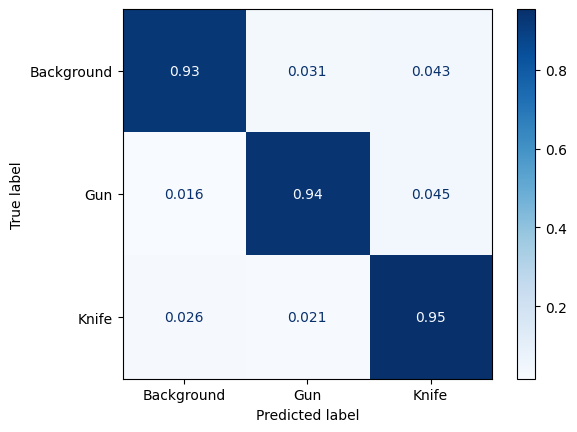

In [9]:
class_labels = ['Background', 'Gun', 'Knife']
disp = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix, display_labels=class_labels)
disp.plot(cmap='Blues')
plt.show()